# Business Case 4: Cryptocurrencies Forecasting

# Contents:
 * [Data Understanding](#DataUnderstanding)
    * [Initial Visualizations](#ImportantVisualizations)
 * [Data Preparation](#DataPreparation)
    * [Feature Engineering](#FeatureEngineering)
    * [Normalization](#Normalization)
    * [Pearson's Correlation Matrix](#CorrelationMatrix)

## Imports

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from math import ceil
import scipy.stats as stats

import plotly.graph_objects as go
import plotly.express as px
import plotly
import calendar
import plotly.offline as py
from plotly.subplots import make_subplots


from sklearn.preprocessing import MinMaxScaler

import warnings
warnings.filterwarnings("ignore")

import yfinance as yf

# Data Understanding <a name="DataUnderstanding"></a>
> After Business Understanding, our goal is to start to be familiar with the data. Here, it's possible to understand some possible patterns, plot important visualizations and first insights that could be useful for the next phases.

## Useful Functions:

In [2]:
#Function to remove rows with NaN values   
def delete_mv (df): 
    df = df.dropna(inplace = True)

#Function to analyse correlations
def correlations (df): 
    correlation = df.corr()
    print(correlation["close"].sort_values(ascending=False))
   

 #Function to add more information regarding date (split date information) 
def preprocess(dataframe):
    add_datepart(dataframe,"date")

In [3]:
#Importing data
adj_close = pd.read_csv('https://raw.githubusercontent.com/andremforte/BC4_GroupV/main/data/adj_close.csv')
close = pd.read_csv('https://raw.githubusercontent.com/andremforte/BC4_GroupV/main/data/close.csv')
open_ = pd.read_csv('https://raw.githubusercontent.com/andremforte/BC4_GroupV/main/data/open.csv')
high = pd.read_csv('https://raw.githubusercontent.com/andremforte/BC4_GroupV/main/data/high.csv')
volume = pd.read_csv('https://raw.githubusercontent.com/andremforte/BC4_GroupV/main/data/volume.csv')
low = pd.read_csv('https://raw.githubusercontent.com/andremforte/BC4_GroupV/main/data/low.csv')

# Initial Visualizations<a name="ImportantVisualizations"></a>

In [4]:
#Plot the currencies to understand the relation over time for all the cripto
fig = px.line(close, x="Date", y = close.columns, 
              hover_data={"Date": "|%B %d, %Y"},
              title= "Distribution of the Criptocurrencies' prices over time",
              )
fig.update_xaxes(rangeslider_visible=True)
fig.show() 

#Plot the currencies to understand the relation over time for all the cripto
fig2 = px.line(close, x="Date", y = close.columns, log_y="True",
              hover_data={"Date": "|%B %d, %Y"},
              title="Distribution of the Criptocurrencies' prices over time (log scale)",
              )
fig2.update_xaxes(rangeslider_visible=True)
fig2.show()


In [5]:
cripto_close = close.copy()
cripto_close = cripto_close.set_index('Date')
#
fig = go.Figure()
for i in cripto_close:
    fig.add_trace(go.Box(
        y=cripto_close[i],
        name=i,   
   ))
    #log the y_axis
    fig.update_yaxes(type="log")
    
fig.update_layout(
    title='Criptocurrency Boxplot for Close Values',title_x=0.5,
    yaxis_title='Values in log scale',
    legend_title="Currencies"
   
    )
fig.show()


In [6]:
#Calculate the pearson correlation coefficients for cryptocurrencies close values,
#for each year between 2017 and 2022
cripto_close_2017 = cripto_close[(cripto_close.index >= '2017-04-26') &
                                 (cripto_close.index<'2018-01-01')]

cripto_close_2018 = cripto_close[(cripto_close.index >= '2018-01-01') &
                                 (cripto_close.index<'2019-01-01')]

cripto_close_2019 = cripto_close[(cripto_close.index >= '2019-01-01') &
                                 (cripto_close.index<'2020-01-01')]

cripto_close_2020 = cripto_close[(cripto_close.index >= '2020-01-01') &
                                 (cripto_close.index<'2021-01-01')]

cripto_close_2021 = cripto_close[(cripto_close.index >= '2021-01-01') &
                                 (cripto_close.index<'2022-01-01')]

cripto_close_2022 = cripto_close[(cripto_close.index >= '2022-01-01') &
                                 (cripto_close.index<'2023-01-01')]

In [7]:
#just to see the correlation matrix values for each year/currency
# pct_change() convert each cell in the dataframe from an absolute price value to a daily return percentage
#cripto_close_2017.pct_change().corr(method='pearson') 
#cripto_close_2018.pct_change().corr(method='pearson')
#cripto_close_2019.pct_change().corr(method='pearson') 
#cripto_close_2020.pct_change().corr(method='pearson') 
#cripto_close_2021.pct_change().corr(method='pearson') 
#cripto_close_2022.pct_change().corr(method='pearson')
#defining function to create heatmap
def correlation_heatmap(df, title, absolute_bounds=True):
    '''Plot a correlation heatmap for the entire dataframe'''
    heatmap = go.Heatmap(
        z=df.corr(method='pearson'),
        x=df.columns,
        y=df.columns,
        colorbar=dict(title='Pearson Coefficient'),
        colorscale='balance',
    )
    
    layout = go.Layout(title=title)
    
    if absolute_bounds:
        heatmap['zmax'] = 1.0
        heatmap['zmin'] = -1.0
        
    fig = go.Figure(data=[heatmap], layout=layout)
    py.iplot(fig)
#plotting the heatmap for each year 
correlation_heatmap(cripto_close_2017.pct_change(), "Cryptocurrency Correlations in 2017")
correlation_heatmap(cripto_close_2018.pct_change(), "Cryptocurrency Correlations in 2018")
correlation_heatmap(cripto_close_2019.pct_change(), "Cryptocurrency Correlations in 2019")
correlation_heatmap(cripto_close_2020.pct_change(), "Cryptocurrency Correlations in 2020")
correlation_heatmap(cripto_close_2021.pct_change(), "Cryptocurrency Correlations in 2021")
correlation_heatmap(cripto_close_2022.pct_change(), "Cryptocurrency Correlations in 2022")


In [8]:
fig = make_subplots(rows=5, cols=2, x_title= 'Date', y_title='Close Values')

ADA = go.Scatter(x=cripto_close.index, y= cripto_close['ADA-USD'], name = 'ADA')
ATOM = go.Scatter(x=cripto_close.index, y= cripto_close['ATOM-USD'], name = 'ATOM')
AVAX = go.Scatter(x=cripto_close.index, y= cripto_close['AVAX-USD'], name = 'AVAX')
AXS = go.Scatter(x=cripto_close.index, y= cripto_close['AXS-USD'], name = 'AXS')
BTC = go.Scatter(x=cripto_close.index, y= cripto_close['BTC-USD'], name = 'BTC')
ETH = go.Scatter(x=cripto_close.index, y= cripto_close['ETH-USD'], name = 'ETH')
LINK = go.Scatter(x=cripto_close.index, y= cripto_close['LINK-USD'], name = 'LINK')
LUNA1 = go.Scatter(x=cripto_close.index, y= cripto_close['LUNA1-USD'], name = 'LUNA1')
MATIC = go.Scatter(x=cripto_close.index, y= cripto_close['MATIC-USD'], name = 'MATIC')
SOL = go.Scatter(x=cripto_close.index, y= cripto_close['SOL-USD'], name = 'SOL')

fig.append_trace(ADA, 1, 1)
fig.append_trace(ATOM, 1, 2)
fig.append_trace(AVAX, 2, 1)
fig.append_trace(AXS, 2, 2)
fig.append_trace(BTC, 3, 1)
fig.append_trace(ETH, 3, 2)
fig.append_trace(LINK, 4, 1)
fig.append_trace(LUNA1, 4, 2)
fig.append_trace(MATIC, 5, 1)
fig.append_trace(SOL, 5, 2)

fig.update_layout(title="Distribution Of Cryptocurrencies' CLosing Prices Over Time", title_x=0.5,
                  legend_title="Currencies",
                  )
fig.show()


In [9]:
lists=adj_close.columns.to_list()
lists.pop(0)
lists

['ADA-USD',
 'ATOM-USD',
 'AVAX-USD',
 'AXS-USD',
 'BTC-USD',
 'ETH-USD',
 'LINK-USD',
 'LUNA1-USD',
 'MATIC-USD',
 'SOL-USD']

In [10]:
data= []
def dataframe(x):
    for i in lists:
        df= pd.DataFrame({'Date':adj_close['Date'],'adj_close':adj_close[i],'close':close[i],'high':high[i],'low':low[i],'open':open_[i],'volume':volume[i]})
        data.append(df)
    return data

In [11]:
dataframe(lists)

[            Date  adj_close     close      high       low      open  \
 0     2017-04-26        NaN       NaN       NaN       NaN       NaN   
 1     2017-04-27        NaN       NaN       NaN       NaN       NaN   
 2     2017-04-28        NaN       NaN       NaN       NaN       NaN   
 3     2017-04-29        NaN       NaN       NaN       NaN       NaN   
 4     2017-04-30        NaN       NaN       NaN       NaN       NaN   
 ...          ...        ...       ...       ...       ...       ...   
 1821  2022-04-21   0.910474  0.910474  0.969453  0.896912  0.937272   
 1822  2022-04-22   0.907154  0.907154  0.923741  0.893973  0.910335   
 1823  2022-04-23   0.888503  0.888503  0.910614  0.884660  0.907185   
 1824  2022-04-24   0.886350  0.886350  0.897855  0.881857  0.888279   
 1825  2022-04-25   0.898695  0.898695  0.901707  0.830232  0.886378   
 
             volume  
 0              NaN  
 1              NaN  
 2              NaN  
 3              NaN  
 4              NaN  
 .

In [12]:
[final_ADA, final_ATOM, final_AVAX, final_AXS, final_BTC, final_ETH, final_LINK, final_LUNA1,final_MATIC, final_SOL]=data[:]

In [13]:
#establishing important lists that may help to create for loops and functions
dfcurrencies = [final_ADA, final_ATOM, final_AVAX, final_AXS, final_BTC, final_ETH, final_LINK, final_LUNA1,final_MATIC, final_SOL]
currencies = ['ADA', 'ATOM', 'AVAX', 'AXS', 'BTC', 'ETH', 'LINK', 'LUNA1', 'MATIC', 'SOL']

In [14]:
#Checking the info in each subdataset
for i, df in enumerate(dfcurrencies):
    print("---------------------------------------------------------------------------")
    print("Information about Dataset of ", currencies[i], ":")
    print(dfcurrencies[i].info())

---------------------------------------------------------------------------
Information about Dataset of  ADA :
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1826 entries, 0 to 1825
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       1826 non-null   object 
 1   adj_close  1629 non-null   float64
 2   close      1629 non-null   float64
 3   high       1629 non-null   float64
 4   low        1629 non-null   float64
 5   open       1629 non-null   float64
 6   volume     1629 non-null   float64
dtypes: float64(6), object(1)
memory usage: 100.0+ KB
None
---------------------------------------------------------------------------
Information about Dataset of  ATOM :
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1826 entries, 0 to 1825
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       1826 non-null   object 
 1   adj_close  1139 non

In [15]:
# checking the descriptive statistics of each coin using describe
for i, value in enumerate(dfcurrencies):
    print("cryptocurrency: ", currencies[i],"\n","\n",dfcurrencies[i].describe(include='all'),"\n")

cryptocurrency:  ADA 
 
               Date    adj_close        close         high          low  \
count         1826  1629.000000  1629.000000  1629.000000  1629.000000   
unique        1826          NaN          NaN          NaN          NaN   
top     2017-04-26          NaN          NaN          NaN          NaN   
freq             1          NaN          NaN          NaN          NaN   
mean           NaN     0.495561     0.495561     0.517245     0.471341   
std            NaN     0.668714     0.668714     0.696980     0.638537   
min            NaN     0.023961     0.023961     0.025993     0.019130   
25%            NaN     0.054981     0.054981     0.056926     0.052368   
50%            NaN     0.119883     0.119883     0.125663     0.113886   
75%            NaN     0.917466     0.917466     0.956904     0.877736   
max            NaN     2.968239     2.968239     3.099186     2.907606   

               open        volume  
count   1629.000000  1.629000e+03  
unique        

In [16]:
#Checking the null values in each subdataset
for i, df in enumerate(dfcurrencies):
     print("Null values in Dataset of ", currencies[i], ":", len(dfcurrencies[i][dfcurrencies[i]['close'].isna()]))

Null values in Dataset of  ADA : 197
Null values in Dataset of  ATOM : 687
Null values in Dataset of  AVAX : 1243
Null values in Dataset of  AXS : 1288
Null values in Dataset of  BTC : 0
Null values in Dataset of  ETH : 197
Null values in Dataset of  LINK : 197
Null values in Dataset of  LUNA1 : 821
Null values in Dataset of  MATIC : 732
Null values in Dataset of  SOL : 1080


In [17]:
#Checking what is the starting date, ending date and duration per cryptocurrency

for i,x in enumerate(dfcurrencies): 
    a = dfcurrencies[i].copy()
    a['Date'] = pd.to_datetime(a.Date)
    
    print("Currency information: ", currencies[i])
    print("Starting date: ",a.iloc[0][0])
    print("Ending date: ", a.iloc[-1][0])
    print("Duration: ", a.iloc[-1][0]-a.iloc[0][0])
    print("---------------------------------------")

Currency information:  ADA
Starting date:  2017-04-26 00:00:00
Ending date:  2022-04-25 00:00:00
Duration:  1825 days 00:00:00
---------------------------------------
Currency information:  ATOM
Starting date:  2017-04-26 00:00:00
Ending date:  2022-04-25 00:00:00
Duration:  1825 days 00:00:00
---------------------------------------
Currency information:  AVAX
Starting date:  2017-04-26 00:00:00
Ending date:  2022-04-25 00:00:00
Duration:  1825 days 00:00:00
---------------------------------------
Currency information:  AXS
Starting date:  2017-04-26 00:00:00
Ending date:  2022-04-25 00:00:00
Duration:  1825 days 00:00:00
---------------------------------------
Currency information:  BTC
Starting date:  2017-04-26 00:00:00
Ending date:  2022-04-25 00:00:00
Duration:  1825 days 00:00:00
---------------------------------------
Currency information:  ETH
Starting date:  2017-04-26 00:00:00
Ending date:  2022-04-25 00:00:00
Duration:  1825 days 00:00:00
------------------------------------

In [18]:
#Getting correlations of the variables with "high" - variable that we want to predict
for i,x in enumerate(dfcurrencies):
    print ("------------------------------------------------------")
    print("Correlations of Currency:", currencies[i], correlations(x))

------------------------------------------------------
adj_close    1.000000
close        1.000000
high         0.998902
low          0.997987
open         0.997049
volume       0.685143
Name: close, dtype: float64
Correlations of Currency: ADA None
------------------------------------------------------
adj_close    1.000000
close        1.000000
high         0.997422
low          0.996525
open         0.993871
volume       0.718598
Name: close, dtype: float64
Correlations of Currency: ATOM None
------------------------------------------------------
adj_close    1.000000
close        1.000000
high         0.997731
low          0.996939
open         0.994061
volume       0.790714
Name: close, dtype: float64
Correlations of Currency: AVAX None
------------------------------------------------------
adj_close    1.000000
close        1.000000
high         0.998438
low          0.997691
open         0.996040
volume       0.380777
Name: close, dtype: float64
Correlations of Currency: AXS Non

### Checking range of prices per cryptocurrency across time

In [19]:
for id, x in enumerate(dfcurrencies): 
    figure = go.Figure(data=[go.Candlestick(x=dfcurrencies[id]['Date'],
                                            open=dfcurrencies[id]["open"], 
                                            high=dfcurrencies[id]["high"],
                                            low=dfcurrencies[id]["low"], 
                                            close=dfcurrencies[id]["close"])])
       # a = currencies[id] "Price Analysis"
    figure.update_layout(title =  currencies[id] + " Price Analysis", 
                        xaxis_rangeslider_visible=False)
    figure.show()

# Data Preparation<a name="DataPreparation"></a>

In [20]:
#Deleting null values and checking if it was corrected
for id, x in enumerate(dfcurrencies): 
    delete_mv(x)
    print("Null values in Dataset of ", currencies[id], ":", len(dfcurrencies[id][dfcurrencies[id]['high'].isna()]))

Null values in Dataset of  ADA : 0
Null values in Dataset of  ATOM : 0
Null values in Dataset of  AVAX : 0
Null values in Dataset of  AXS : 0
Null values in Dataset of  BTC : 0
Null values in Dataset of  ETH : 0
Null values in Dataset of  LINK : 0
Null values in Dataset of  LUNA1 : 0
Null values in Dataset of  MATIC : 0
Null values in Dataset of  SOL : 0


## Feature Engineering<a name="FeatureEngineering"></a>

## 1. New features based on the original variables

In [21]:
for i,x in enumerate(dfcurrencies): 
    dfcurrencies[i]['SMA_7'] = dfcurrencies[i]['close'].rolling(window=7).mean()    #Simple Moving Average - 7 days
    dfcurrencies[i]['EMA_7'] = dfcurrencies[i]['close'].ewm(span=7, adjust=False).mean()    #Exponential Moving Average - 7 days
    
    #Stochastic Oscillator
    dfcurrencies[i]['14-high'] = dfcurrencies[i]['high'].rolling(14).max()
    dfcurrencies[i]['14-low'] = dfcurrencies[i]['low'].rolling(14).min()
    dfcurrencies[i]['%K'] = (dfcurrencies[i]['close'] - dfcurrencies[i]['14-low'])*100/(dfcurrencies[i]['14-high'] - dfcurrencies[i]['14-low'])
    dfcurrencies[i]['%D'] = dfcurrencies[i]['%K'].rolling(3).mean()
    
    #Other important measures
    dfcurrencies[i]['spread'] =  dfcurrencies[i]['high'] -  dfcurrencies[i]['low']
    dfcurrencies[i]['volatility'] =  dfcurrencies[i]['spread'] /  dfcurrencies[i]['open']
    dfcurrencies[i]['close_off_high'] =  dfcurrencies[i]['close']- dfcurrencies[i]['high']

In [22]:
final_ADA.head()

,Date,adj_close,close,high,low,open,volume,SMA_7,EMA_7,14-high,14-low,%K,%D,spread,volatility,close_off_high
197,2017-11-09,0.032053,0.032053,0.035060,0.025006,0.025160,18716200.0,NaN,0.032053,NaN,NaN,NaN,NaN,0.010054,0.399603,-0.003007
198,2017-11-10,0.027119,0.027119,0.033348,0.026451,0.032219,6766780.0,NaN,0.030820,NaN,NaN,NaN,NaN,0.006897,0.214066,-0.006229
199,2017-11-11,0.027437,0.027437,0.029659,0.025684,0.026891,5532220.0,NaN,0.029974,NaN,NaN,NaN,NaN,0.003975,0.147819,-0.002222
200,2017-11-12,0.023977,0.023977,0.027952,0.022591,0.027480,7280250.0,NaN,0.028475,NaN,NaN,NaN,NaN,0.005361,0.195087,-0.003975
201,2017-11-13,0.025808,0.025808,0.026300,0.023495,0.024364,4419440.0,NaN,0.027808,NaN,NaN,NaN,NaN,0.002805,0.115129,-0.000492


In [23]:
dfcurrencies = [final_ADA, final_ATOM, final_AVAX, final_AXS, final_BTC, final_ETH, final_LINK, final_LUNA1,final_MATIC, final_SOL]

## 2. New variable with external data - EUR-USD prices

In [24]:
euro_dollar = yf.download("EURUSD=X", 
               start="2017-04-26", 
               end="2022-04-25" )

[*********************100%***********************]  1 of 1 completed


In [25]:
external_data = euro_dollar['Close']
external_data = pd.DataFrame(external_data)
external_data.reset_index(inplace = True)

In [26]:
external_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1301 entries, 0 to 1300
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    1301 non-null   datetime64[ns]
 1   Close   1301 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 20.5 KB


In [27]:
dfcurrencies[i]

,Date,adj_close,close,high,low,open,volume,SMA_7,EMA_7,14-high,14-low,%K,%D,spread,volatility,close_off_high
1080,2020-04-10,0.951054,0.951054,1.313487,0.694187,0.832005,8.736428e+07,NaN,0.951054,NaN,NaN,NaN,NaN,0.619300,0.744347,-0.362433
1081,2020-04-11,0.776819,0.776819,1.049073,0.765020,0.951054,4.386244e+07,NaN,0.907495,NaN,NaN,NaN,NaN,0.284053,0.298672,-0.272254
1082,2020-04-12,0.882507,0.882507,0.956670,0.762426,0.785448,3.873690e+07,NaN,0.901248,NaN,NaN,NaN,NaN,0.194244,0.247303,-0.074163
1083,2020-04-13,0.777832,0.777832,0.891603,0.773976,0.890760,1.821128e+07,NaN,0.870394,NaN,NaN,NaN,NaN,0.117627,0.132052,-0.113771
1084,2020-04-14,0.661925,0.661925,0.796472,0.628169,0.777832,1.674761e+07,NaN,0.818277,NaN,NaN,NaN,NaN,0.168303,0.216375,-0.134547
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1821,2022-04-21,101.776138,101.776138,109.765327,100.767151,105.497673,1.838572e+09,103.141499,104.016040,122.254120,95.242775,24.187479,34.595127,8.998177,0.085293,-7.989189
1822,2022-04-22,100.612053,100.612053,103.498146,99.579430,101.757423,1.274794e+09,103.041824,103.165043,115.808327,95.242775,26.108115,29.419420,3.918716,0.038510,-2.886093
1823,2022-04-23,100.744438,100.744438,102.771233,98.781570,100.619781,8.232525e+08,102.825699,102.559892,115.808327,95.242775,26.751839,25.682478,3.989662,0.039651,-2.026794
1824,2022-04-24,99.235794,99.235794,102.216682,99.008514,100.727188,8.182660e+08,102.657998,101.728867,111.831139,95.242775,24.071206,25.643720,3.208168,0.031850,-2.980888


In [28]:
finalcurrencies = []

for i,x in enumerate(dfcurrencies): 
  #  del dfcurrencies[i]['index']   #removing extra index column 
    dfcurrencies[i]['Date'] = pd.to_datetime(dfcurrencies[i]['Date']) #converting to datetype
    cur = pd.merge(dfcurrencies[i], external_data, on ='Date', how = 'outer',sort=True) #merging to the close prices
    curr = cur.merge(dfcurrencies[i], on ='Date', how = 'inner',sort=True, suffixes=('', '_y')) #filter the real number of rows by merging the real dataset 
    curr.drop(curr.filter(regex='_y$').columns.tolist(),axis=1, inplace=True) #deleting the extra columns with suffixes 'y'
    finalcurrencies.append(curr) #append in the list 
    finalcurrencies[i]['Close'].ffill(axis = 0, inplace = True) #filling the Nan's (weekend day's) from 'Close' with the previous value (Friday)
    finalcurrencies[i].rename(columns = {'Close': 'EUR/USD_close'}, inplace = True)

In [29]:
 [final_ADA, final_ATOM, final_AVAX, final_AXS, final_BTC, final_ETH, final_LINK, final_LUNA1,final_MATIC, final_SOL] = finalcurrencies[0:]

In [30]:
#use the lose price of Bitcoin to predict the values of the other currencies
z = final_BTC[['Date', 'close']]
z.rename(columns={'close': 'BTC_closeprice'}, inplace = True)
z['Date'] = pd.to_datetime(z['Date'])

In [31]:
values= [final_ADA, final_ATOM, final_AVAX, final_AXS, final_ETH, final_LINK, final_LUNA1,final_MATIC, final_SOL]

In [32]:
df=[]
for i,x in enumerate(values):
    data= pd.merge(x, z, on = 'Date', how = 'inner')
    df.append(data)

In [33]:
[final_ADA, final_ATOM, final_AVAX, final_AXS, final_ETH, final_LINK, final_LUNA1,final_MATIC, final_SOL]=df[:]

In [34]:
finalcurrencies = [final_ADA, final_ATOM, final_AVAX, final_AXS, final_BTC, final_ETH, final_LINK, final_LUNA1,final_MATIC, final_SOL]

## Normalization<a name="Normalization"></a>

In [35]:
for id, x in enumerate(finalcurrencies):
    finalcurrencies[id].set_index('Date',inplace = True)
    x.dropna(inplace = True)

In [36]:
m=[]
for i, x in enumerate(finalcurrencies):
    scaler = MinMaxScaler().fit(x)
    df = pd.DataFrame(scaler.transform(x), columns=x.columns).set_index(x.index)
    m.append(df)

In [37]:
[final_ADA, final_ATOM, final_AVAX, final_AXS, final_BTC, final_ETH, final_LINK, final_LUNA1,final_MATIC, final_SOL]=m[:]

In [38]:
finalcurrencies = [final_ADA, final_ATOM, final_AVAX, final_AXS, final_BTC, final_ETH, final_LINK, final_LUNA1,final_MATIC, final_SOL]

## Pearson's Correlation Matrix<a name="CorrelationMatrix"></a>

In [39]:
#Getting correlations of the variables with "close" - variable that we want to predict
for i,x in enumerate(finalcurrencies):
    print ("------------------------------------------------------")
    print("Correlations of Currency:", currencies[i], correlations(x))

------------------------------------------------------
adj_close         1.000000
close             1.000000
high              0.998897
low               0.997978
open              0.997036
EMA_7             0.996591
SMA_7             0.995146
14-high           0.988867
14-low            0.976921
BTC_closeprice    0.888211
spread            0.738533
volume            0.684087
EUR/USD_close     0.271225
volatility        0.062669
%D                0.034914
%K                0.029256
close_off_high   -0.643242
Name: close, dtype: float64
Correlations of Currency: ADA None
------------------------------------------------------
adj_close         1.000000
close             1.000000
high              0.997426
low               0.996507
EMA_7             0.994302
open              0.993865
SMA_7             0.991862
14-high           0.982422
14-low            0.967897
BTC_closeprice    0.877301
spread            0.759115
volume            0.716705
EUR/USD_close     0.212423
volatility       

__________________Initial correlation Matrix of Currency:  ADA _____________________________________


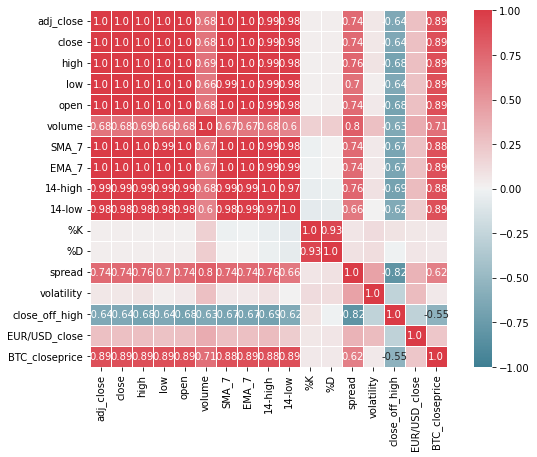

__________________Initial correlation Matrix of Currency:  ATOM _____________________________________


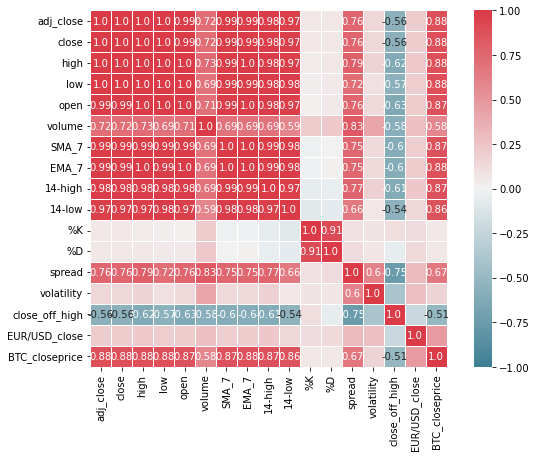

__________________Initial correlation Matrix of Currency:  AVAX _____________________________________


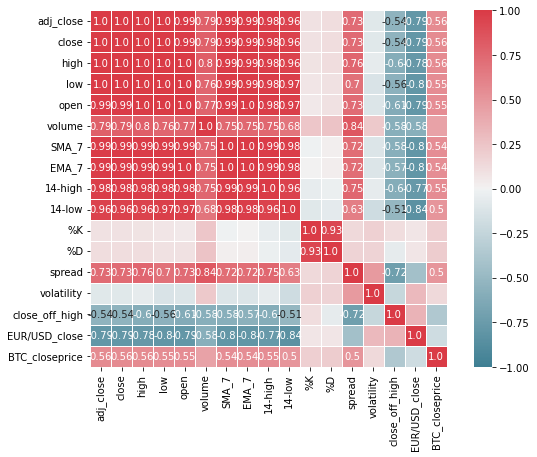

__________________Initial correlation Matrix of Currency:  AXS _____________________________________


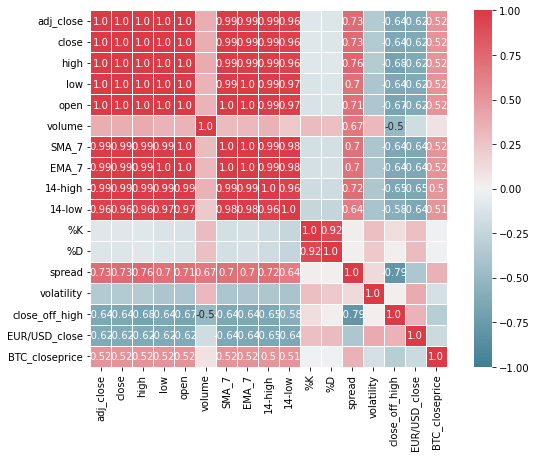

__________________Initial correlation Matrix of Currency:  BTC _____________________________________


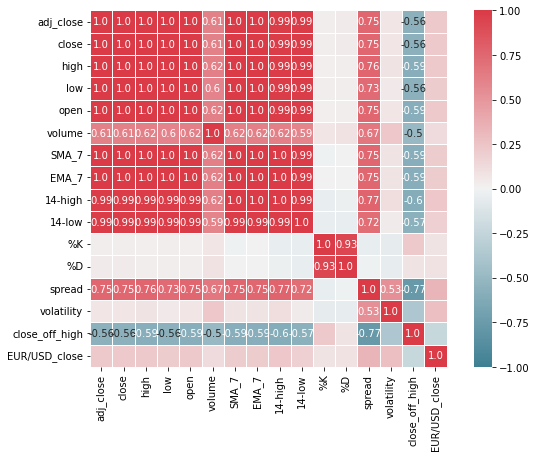

__________________Initial correlation Matrix of Currency:  ETH _____________________________________


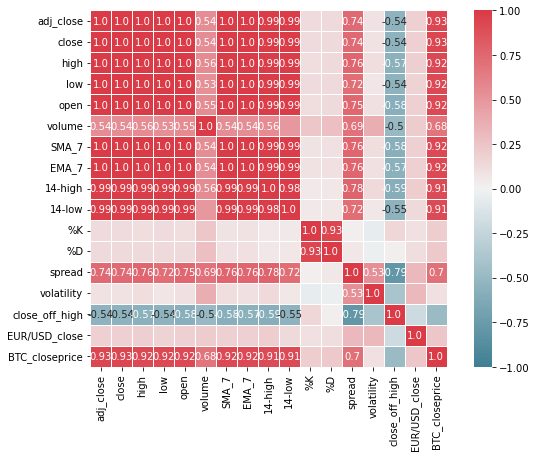

__________________Initial correlation Matrix of Currency:  LINK _____________________________________


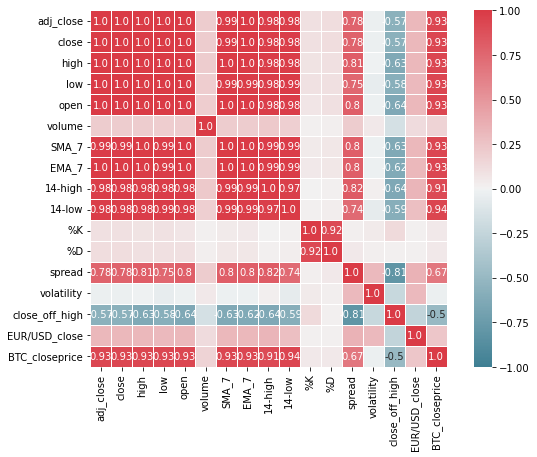

__________________Initial correlation Matrix of Currency:  LUNA1 _____________________________________


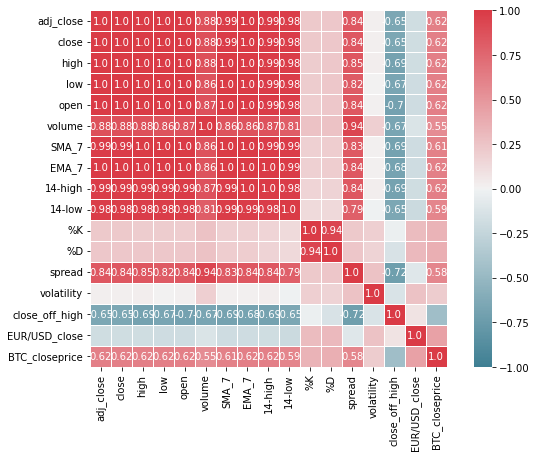

__________________Initial correlation Matrix of Currency:  MATIC _____________________________________


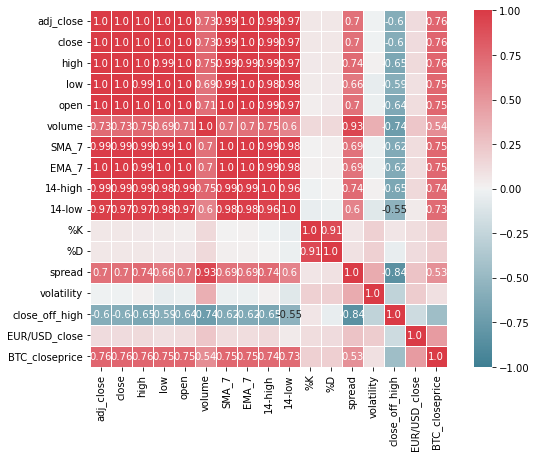

__________________Initial correlation Matrix of Currency:  SOL _____________________________________


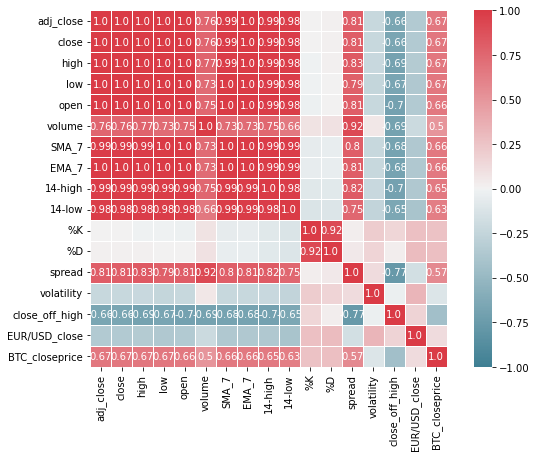

In [40]:
for i,x in enumerate(finalcurrencies):
    
    print("__________________Initial correlation Matrix of Currency: ", currencies[i], "_____________________________________")
   
    # Prepare figure
    fig = plt.figure(figsize=(10,6))
    # Obtain correlation matrix. Round the values to 2 decimal cases. Use the DataFrame corr() and round() method.
    corr = np.round(finalcurrencies[i].corr(method="pearson"), decimals=2)

    # Build annotation matrix (values above |0.5| will appear annotated in the plot)
    mask_annot = np.absolute(corr.values) >= 0.5
    annot = np.where(mask_annot, corr.values, np.full(corr.shape,""))

    # Plot heatmap of the correlation matrix
    sns.heatmap(data=corr, annot=annot, cmap=sns.diverging_palette(220, 10, as_cmap=True), 
                fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

    # Layout
    fig.subplots_adjust(top=0.95)
  #  fig.suptitle("Pearson Correlation Matrix", fontsize=10)

    plt.show()

### Conclusions (redudant variables): 

> ### Currencies: ADA, ATOM, ETH, LINK:
"open", "high", "adj_close", "low", "SMA_7", "EMA_7", "14-high", "14-low", "%K", "BTC_closeprice"
> ### Currencies: BTC, AVAX, AXS, LUNA1, MATIC, SOL:
"open", "high", "adj_close", "low", "SMA_7", "EMA_7", "14-high", "14-low", "%K"
>### Currencies: LUNA1, SOL, MATIC:
"spread" (highly correlated to others)
> ### Currency: LUNA1
"volume" (highly correlated to the target)




## Drop redudant variables

In [41]:
redundant_columns= ["open", "high", "adj_close", "low", "SMA_7", "EMA_7", "14-high", "14-low", "%K"]

In [42]:
#dropping redundant variables 
for i,x in enumerate(finalcurrencies):
    x.drop(redundant_columns, axis = 1, inplace = True)

In [43]:
final_ADA.drop('BTC_closeprice', axis = 1, inplace = True)
final_ATOM.drop('BTC_closeprice', axis = 1, inplace = True)
final_ETH.drop('BTC_closeprice', axis = 1, inplace = True)
final_LINK.drop('BTC_closeprice', axis = 1, inplace = True)

In [44]:
final_LUNA1.drop(['spread', 'volume'], axis = 1, inplace = True)
final_SOL.drop('spread', axis = 1, inplace = True)
final_MATIC.drop('spread', axis = 1, inplace = True)

## Final Correlation Matrix

__________________Final correlation Matrix of Currency:  ADA _____________________________________


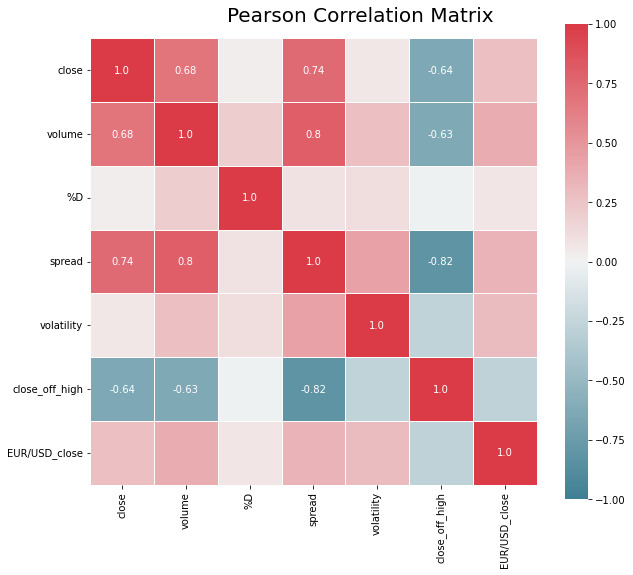

__________________Final correlation Matrix of Currency:  ATOM _____________________________________


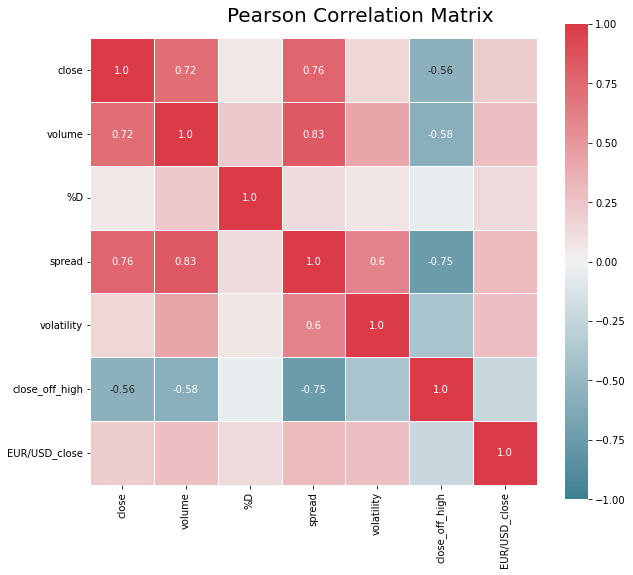

__________________Final correlation Matrix of Currency:  AVAX _____________________________________


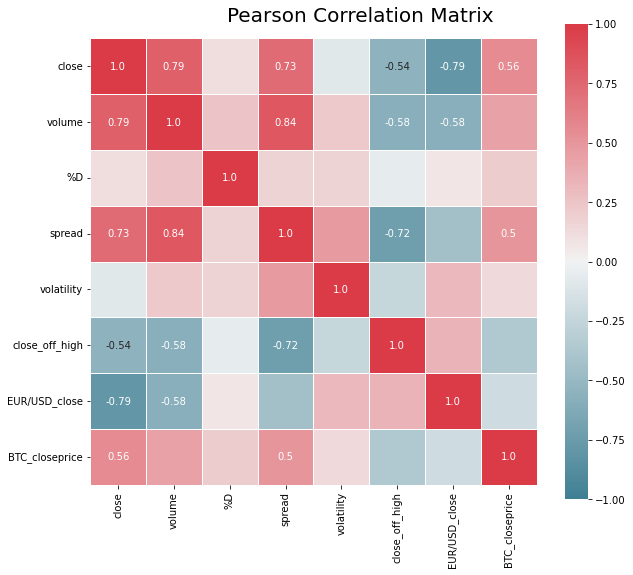

__________________Final correlation Matrix of Currency:  AXS _____________________________________


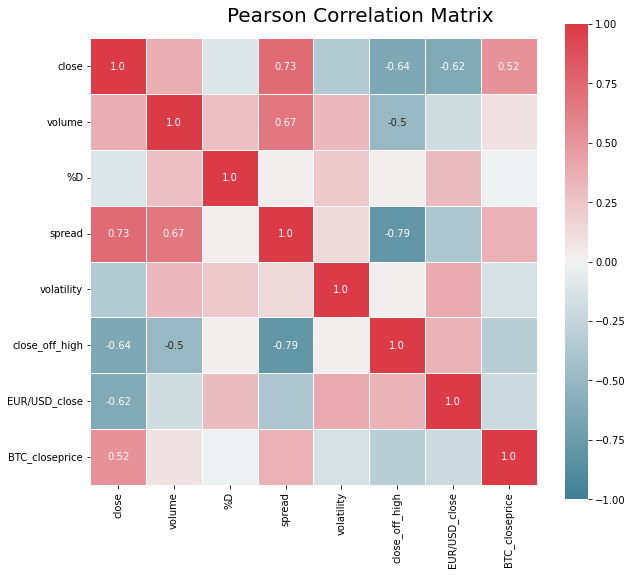

__________________Final correlation Matrix of Currency:  BTC _____________________________________


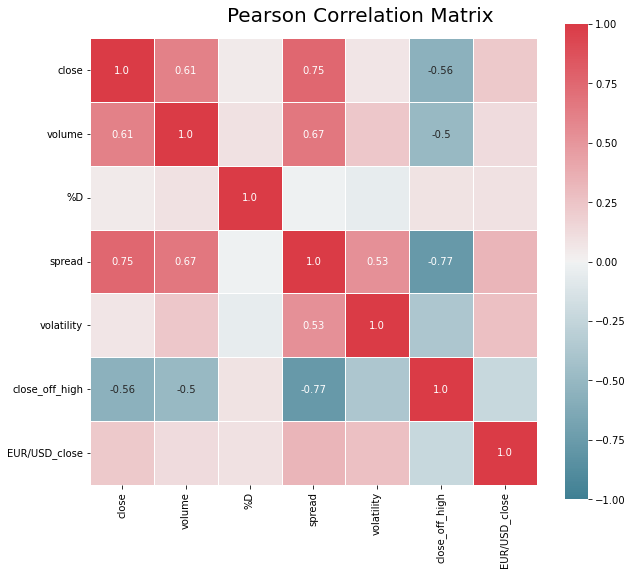

__________________Final correlation Matrix of Currency:  ETH _____________________________________


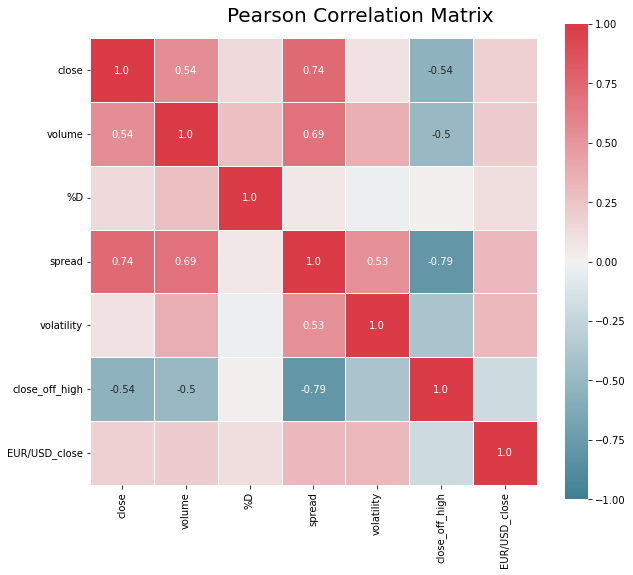

__________________Final correlation Matrix of Currency:  LINK _____________________________________


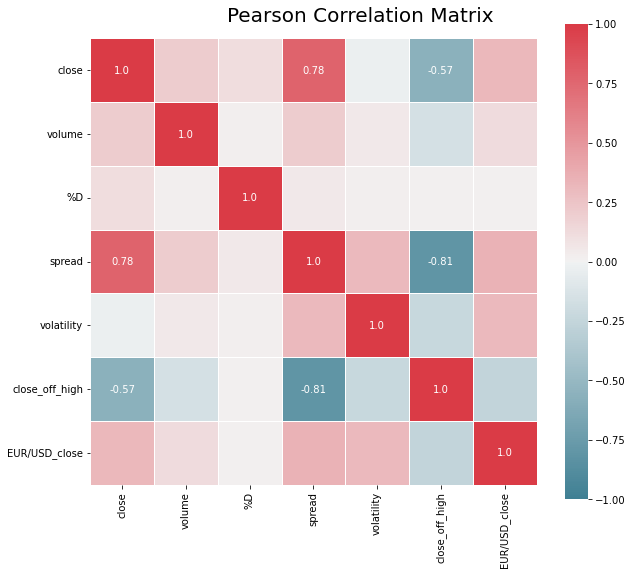

__________________Final correlation Matrix of Currency:  LUNA1 _____________________________________


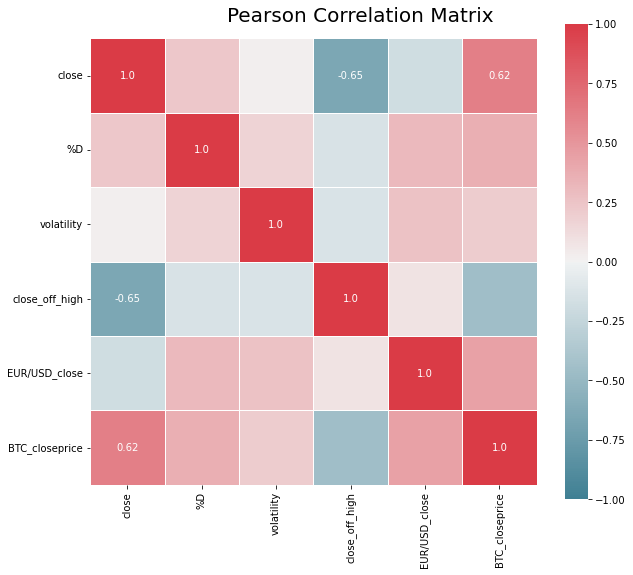

__________________Final correlation Matrix of Currency:  MATIC _____________________________________


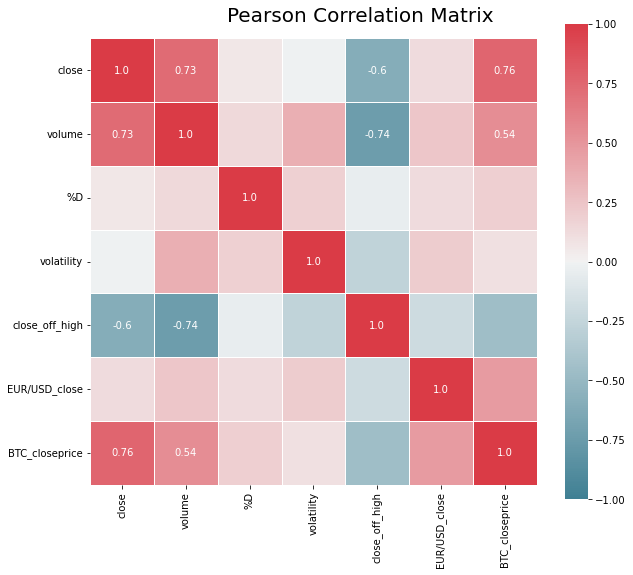

__________________Final correlation Matrix of Currency:  SOL _____________________________________


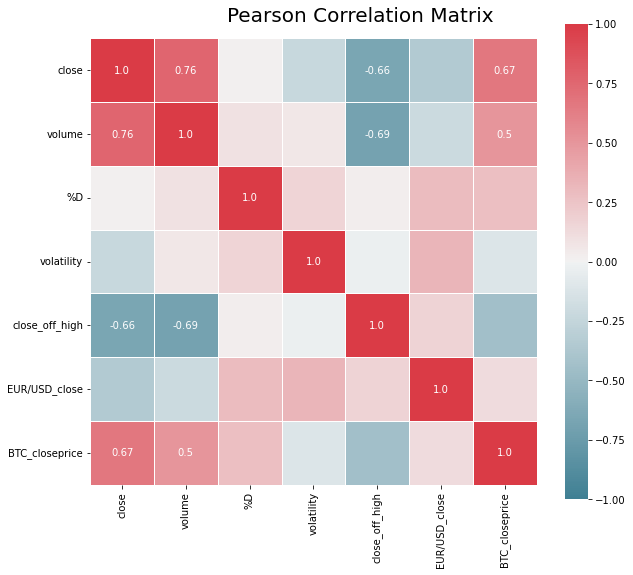

In [45]:
dfcurrencies = [final_ADA, final_ATOM, final_AVAX, final_AXS, final_BTC, final_ETH, final_LINK, final_LUNA1,final_MATIC, final_SOL]

for i,x in enumerate(dfcurrencies):
    print("__________________Final correlation Matrix of Currency: ", currencies[i], "_____________________________________")
    # Prepare figure
    fig = plt.figure(figsize=(10, 8))

    # Obtain correlation matrix. Round the values to 2 decimal cases. Use the DataFrame corr() and round() method.
    corr = np.round(dfcurrencies[i].corr(method="pearson"), decimals=2)

    # Build annotation matrix (values above |0.5| will appear annotated in the plot)
    mask_annot = np.absolute(corr.values) >= 0.5
    annot = np.where(mask_annot, corr.values, np.full(corr.shape,""))

    # Plot heatmap of the correlation matrix
    sns.heatmap(data=corr, annot=annot, cmap=sns.diverging_palette(220, 10, as_cmap=True), 
                fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

    # Layout
    fig.subplots_adjust(top=0.95)
    fig.suptitle("Pearson Correlation Matrix", fontsize=20)

    plt.show()

In [46]:
dfcurrencies = [final_ADA, final_ATOM, final_AVAX, final_AXS, final_BTC, final_ETH, final_LINK, final_LUNA1,final_MATIC, final_SOL]

In [47]:
currencies = ['ADA', 'ATOM', 'AVAX', 'AXS', 'BTC', 'ETH', 'LINK', 'LUNA1', 'MATIC', 'SOL']

for i,x in enumerate(dfcurrencies):
    dfcurrencies[i].to_csv(str(currencies[i]) + ".csv", index=True)